<a href="https://colab.research.google.com/github/SSInimgba/Computer_Vision/blob/master/RiceorNotRice.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

We have gathered a dataset of rice dishes from google images. Manually inspecting the dataset showed that there are images included that are not food. So to improve the quality of the dataset, we will create a binary classifier that helps us filter non-food images from our dataset.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [ ]:
#Import the necessary libraries

from PIL import Image
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.autograd import Variable
from torch.optim import Adam, SGD
from torch.utils.data import Dataset, DataLoader, ConcatDataset
import torchvision
import torchvision.datasets as dset
from torchvision import transforms
import matplotlib.pyplot as plt
import random


## Organizing the data into subfolders using shell commands

In [ ]:
!unzip  -q "/content/drive/My Drive/Colab Notebooks/Nigerian_Food_Project/Food-5K.zip"

In [ ]:
!unzip -q "/content/drive/My Drive/Colab Notebooks/Nigerian_Food_Project/images.zip"

In [ ]:
%cd /content/Food-5K/evaluation

/content/Food-5K/evaluation


In [ ]:
mv * 1

mv: cannot move '1' to a subdirectory of itself, '1/1'


## Reading in the data

In [ ]:

#Transform Image
transformations = transforms.Compose([
                            transforms.RandomRotation(30),
                            transforms.Resize(224),
                            transforms.CenterCrop(224),
                            transforms.ColorJitter(hue=.05, saturation=.05),
                            transforms.RandomHorizontalFlip(),
                            transforms.RandomVerticalFlip(),
                            transforms.ToTensor(),
                            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

In [ ]:
train_data = dset.ImageFolder('/content/Food-5K/training', transform = transformations)
train_loader = torch.utils.data.DataLoader(train_data, batch_size=32, shuffle=True)
val_data = dset.ImageFolder('/content/Food-5K/validation', transform = transformations)
val_loader = torch.utils.data.DataLoader(val_data, batch_size=32, shuffle=True)
eval_data = dset.ImageFolder('/content/Food-5K/evaluation', transform = transformations)
eval_loader = torch.utils.data.DataLoader(eval_data, batch_size=32, shuffle=True)

In [ ]:
#Image Labels
classes = train_data.classes
classes

['0', '1']

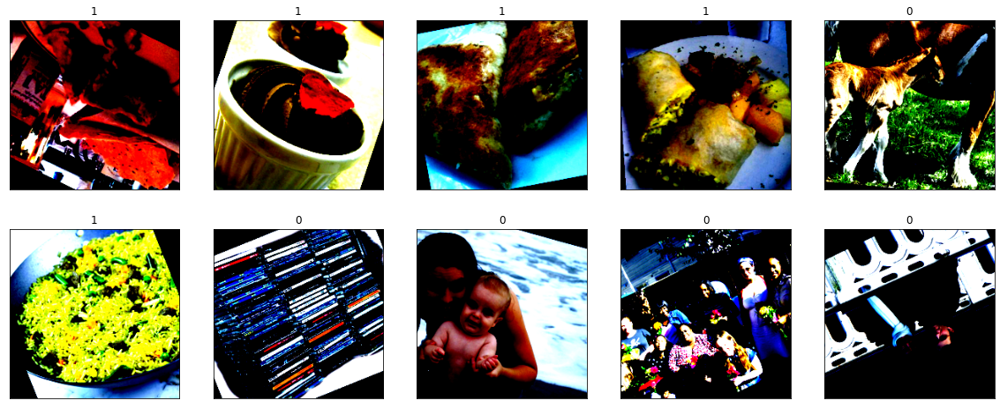

In [ ]:
def imshow(img):
    plt.imshow(np.transpose(img, (1, 2, 0)))  # convert from Tensor image
    
# obtain one batch of training images
dataiter = iter(train_loader)
images, labels = dataiter.next()
images = images.numpy() # convert images to numpy for display
images = np.clip(images, 0, 1)

# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(20, 8))

# display 10 images
for idx in np.arange(10):
    ax = fig.add_subplot(2, 10/2, idx+1, xticks=[], yticks=[])
    imshow(images[idx])
    ax.set_title(classes[labels[idx]])



```
# This is formatted as code
```

##Create CNN to train on our data

In [ ]:
class Net(nn.Module):
  def __init__(self):
    super(Net, self).__init__()

    #Convolutional layer
    self.conv1 = nn.Conv2d(3,16,5)

    #Max Pooling layer
    self.pool = nn.MaxPool2d(2,2)

    #Second convolutional layer
    self.conv2 = nn.Conv2d(16,32,5)

    #Dropout Layer
    self.dropout = nn.Dropout(0.2)

    #Fully Connected Layers
    self.fc1 = nn.Linear(32*53*53, 256)
    self.fc2 = nn.Linear(256,84)
    self.fc3 = nn.Linear(84,2)
    self.softmax = nn.LogSoftmax(dim = 1)



  def forward(self,x):
    #add sequence of convolutional and max pooling layers
    x = self.pool(F.relu(self.conv1(x)))
    x = self.pool(F.relu(self.conv2(x)))
    x = self.dropout(x)
    x = x.view(-1,32*53*53)
    x = F.relu(self.fc1(x))
    x = self.dropout(F.relu(self.fc2(x)))
    x = self.softmax(self.fc3(x))
    return x

In [ ]:
#Create a CNN
train_on_gpu = torch.cuda.is_available()
model = Net()

if train_on_gpu:
  model = model.cuda()

In [ ]:
model

Net(
  (conv1): Conv2d(3, 16, kernel_size=(5, 5), stride=(1, 1))
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(16, 32, kernel_size=(5, 5), stride=(1, 1))
  (dropout): Dropout(p=0.2, inplace=False)
  (fc1): Linear(in_features=89888, out_features=256, bias=True)
  (fc2): Linear(in_features=256, out_features=84, bias=True)
  (fc3): Linear(in_features=84, out_features=2, bias=True)
  (softmax): LogSoftmax(dim=1)
)

In [ ]:
#Loss Funtion
criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.SGD(model.parameters(), lr = 0.001, momentum = 0.9)

In [ ]:
# number of epochs to train the model
n_epochs = 10
valid_loss_min = np.Inf # track change in validation loss

for epoch in range(1, n_epochs+1):

    # keep track of training and validation loss
    train_loss = 0.0
    valid_loss = 0.0
    
    ###################
    # train the model #
    ###################
    model.train()
    for data, target in train_loader:
        # move tensors to GPU if CUDA is available
        if train_on_gpu:
            data, target = data.cuda(), target.cuda()
        # clear the gradients of all optimized variables
        optimizer.zero_grad()
        # forward pass: compute predicted outputs by passing inputs to the model
        output = model(data)
        # calculate the batch loss
        loss = criterion(output, target)
        # backward pass: compute gradient of the loss with respect to model parameters
        loss.backward()
        # perform a single optimization step (parameter update)
        optimizer.step()
        # update training loss
        train_loss += loss.item()*data.size(0)
        
    ######################    
    # validate the model #
    ######################
    model.eval()
    for data, target in val_loader:
        # move tensors to GPU if CUDA is available
        if train_on_gpu:
            data, target = data.cuda(), target.cuda()
        # forward pass: compute predicted outputs by passing inputs to the model
        output = model(data)
        # calculate the batch loss
        loss = criterion(output, target)
        # update average validation loss 
        valid_loss += loss.item()*data.size(0)
    
    # calculate average losses
    train_loss = train_loss/len(train_data)
    valid_loss = valid_loss/len(val_data)
        
    # print training/validation statistics 
    print('Epoch: {} \tTraining Loss: {:.6f} \tValidation Loss: {:.6f}'.format(
        epoch, train_loss, valid_loss))
    
    # save model if validation loss has decreased
    if valid_loss <= valid_loss_min:
        print('Validation loss decreased ({:.6f} --> {:.6f}).  Saving model ...'.format(
        valid_loss_min,
        valid_loss))
        torch.save(model.state_dict(), 'model_food.pt')
        valid_loss_min = valid_loss

#Model with a pretrained data

In [ ]:
import torchvision.models as models

In [ ]:
model = torchvision.models.resnet34(pretrained=True)

for param in model.parameters():
    param.requires_grad = False
    # Replace the last fully-connected layer
     # Parameters of newly constructed modules have requires_grad=True by default

features = model.fc.in_features
model.fc = nn.Linear(features,2)


train_on_gpu = torch.cuda.is_available()

if train_on_gpu:
  model = model.cuda()



Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/hub/checkpoints/resnet34-333f7ec4.pth


In [ ]:
#Loss Funtion
criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr = 0.001)

In [ ]:
#Transform Image
transformations = transforms.Compose([
                            transforms.RandomRotation(30),
                            transforms.Resize(224),
                            transforms.CenterCrop(224),
                            transforms.ColorJitter(hue=.05, saturation=.05),
                            transforms.RandomHorizontalFlip(),
                            transforms.RandomVerticalFlip(),
                            transforms.ToTensor(),
                            transforms.Normalize(mean=[0.485, 0.456, 0.406], 
                                      std=[0.229, 0.224, 0.225])
])

test_transformations = transforms.Compose([
                            transforms.Resize(224),
                            transforms.CenterCrop(224),
                            transforms.ToTensor(),
                            transforms.Normalize(mean=[0.485, 0.456, 0.406], 
                                        std=[0.229, 0.224, 0.225])
])

train_data = dset.ImageFolder('/content/Food-5K/training', transform = transformations)
train_loader = torch.utils.data.DataLoader(train_data, batch_size=32, shuffle=True,drop_last=False)
val_data = dset.ImageFolder('/content/Food-5K/validation', transform = transformations)
val_loader = torch.utils.data.DataLoader(val_data, batch_size=32, shuffle=True,drop_last=False)
eval_data = dset.ImageFolder('/content/Food-5K/evaluation', transform = test_transformations)
eval_loader = torch.utils.data.DataLoader(eval_data, batch_size=32, shuffle=True,drop_last=False)

In [ ]:
# number of epochs to train the model
n_epochs = 25
valid_loss_min = np.Inf # track change in validation loss

print("Started Training...")
for epoch in range(1, n_epochs+1):

    # keep track of training and validation loss
    train_loss = 0.0
    valid_loss = 0.0
    
    ###################
    # train the model #
    ###################
    model.train()
    for data, target in train_loader:
        # move tensors to GPU if CUDA is available
        if train_on_gpu:
            data, target = data.cuda(), target.cuda()
        # clear the gradients of all optimized variables
        optimizer.zero_grad()
        # forward pass: compute predicted outputs by passing inputs to the model
        output = model(data)
        # calculate the batch loss
        loss = criterion(output, target)
        # backward pass: compute gradient of the loss with respect to model parameters
        loss.backward()
        # perform a single optimization step (parameter update)
        optimizer.step()
        # update training loss
        train_loss += loss.item()*data.size(0)
        
    ######################    
    # validate the model #
    ######################
    model.eval()
    with torch.no_grad():

      for data, target in val_loader:
          # move tensors to GPU if CUDA is available
          if train_on_gpu:
              data, target = data.cuda(), target.cuda()
          # forward pass: compute predicted outputs by passing inputs to the model
          output = model(data)
          # calculate the batch loss
          loss = criterion(output, target)
          # update average validation loss 
          valid_loss += loss.item()*data.size(0)
      
      # calculate average losses
      train_loss = train_loss/len(train_data)
      valid_loss = valid_loss/len(val_data)
          
      # print training/validation statistics 
      print('Epoch: {} \tTraining Loss: {:.6f} \tValidation Loss: {:.6f}'.format(
          epoch, train_loss, valid_loss))
      
      # save model if validation loss has decreased
      if valid_loss <= valid_loss_min:
          print('Validation loss decreased ({:.6f} --> {:.6f}).  Saving model ...'.format(
          valid_loss_min,
          valid_loss))
          torch.save(model.state_dict(), 'model_food_2.pt')
          valid_loss_min = valid_loss
print("Finished training")

Started Training...
Epoch: 1 	Training Loss: 0.224845 	Validation Loss: 0.105613
Validation loss decreased (inf --> 0.105613).  Saving model ...
Epoch: 2 	Training Loss: 0.114732 	Validation Loss: 0.083448
Validation loss decreased (0.105613 --> 0.083448).  Saving model ...
Epoch: 3 	Training Loss: 0.114023 	Validation Loss: 0.073609
Validation loss decreased (0.083448 --> 0.073609).  Saving model ...
Epoch: 4 	Training Loss: 0.096766 	Validation Loss: 0.068832
Validation loss decreased (0.073609 --> 0.068832).  Saving model ...
Epoch: 5 	Training Loss: 0.092383 	Validation Loss: 0.054091
Validation loss decreased (0.068832 --> 0.054091).  Saving model ...
Epoch: 6 	Training Loss: 0.092414 	Validation Loss: 0.065867
Epoch: 7 	Training Loss: 0.075823 	Validation Loss: 0.066821
Epoch: 8 	Training Loss: 0.084700 	Validation Loss: 0.061510
Epoch: 9 	Training Loss: 0.076314 	Validation Loss: 0.064390
Epoch: 10 	Training Loss: 0.087698 	Validation Loss: 0.056807
Epoch: 11 	Training Loss: 0.0

In [ ]:
# load the model that got the best validation accuracy 
model.load_state_dict(torch.load('model_food_2.pt'))

<All keys matched successfully>

In [ ]:
# track test loss
test_loss = 0.0
batch_size = 32
class_correct = list(0. for i in range(2)) #[0.0, 0.0]
class_incorrect = list(0. for i in range(2)) #[0.0, 0.0]
class_total = list(0. for i in range(2)) #[0.0, 0.0]





model.eval()#
i=1
# iterate over test data
len(val_loader) #39

for data, target in val_loader:
    i=i+1
    if len(target)!= batch_size:
        continue
        
    # move tensors to GPU if CUDA is available
    if train_on_gpu:
        data, target = data.cuda(), target.cuda()

    # forward pass: compute predicted outputs by passing inputs to the model
    output = model(data)
    
    # calculate the batch loss
    loss = criterion(output, target)

    # update test loss 
    test_loss += loss.item()*data.size(0)

    # convert output probabilities to predicted class
    _, pred = torch.max(output, 1) #_ is a tensor, pred is the label

    # compare predictions to true label
    correct_tensor = pred.eq(target.data.view_as(pred)) #tensor of boolean result comparing the prediction to the actual labels
    correct = np.squeeze(correct_tensor.numpy()) if not train_on_gpu else np.squeeze(correct_tensor.cpu().numpy()) #returns array in reduced dimension
    # calculate test accuracy for each object class

    
    for i in range(batch_size):       
        label = target.data[i] #gets a label at a particular index
        class_correct[label] += correct[i].item() #adds a count to the label[0,1] if correct[i].item() is True.
        class_incorrect[label] += (correct[i].item()) == 0 #adds a count to the label[0,1] if correct[i].item() is False.
        class_total[label] += 1 #culminates total for each label eg [0:20,1:40]
  

# average test loss
test_loss = test_loss/len(val_data)
print(f'Test Loss: {test_loss}\n')

for i in range(2):
    if class_total[i] > 0:
        print(f'Test Accuracy of {classes[i]}: {100* class_correct[i]//class_total[i]}% ({np.sum(class_correct[i])}/{np.sum(class_total[i])})')
        print(f'Test Inaccuracy of {classes[i]}: {100* class_incorrect[i]//class_total[i]}% ({np.sum(class_incorrect[i])}/{np.sum(class_total[i])})')
        print('\n')  
    else:
        print(f'Test Accuracy of {classes[i]}: N/A (no training examples)')

print(f'\nTest Accuracy (Overall): {100. * np.sum(class_correct) // np.sum(class_total)}% ({np.sum(class_correct)}/{np.sum(class_total)})') 
print(f'Test Inaccuracy (Overall): {100. * np.sum(class_incorrect) // np.sum(class_total)}% ({np.sum(class_incorrect)}/{np.sum(class_total)})') 

Test Loss: 0.05458221014311784

Test Accuracy of 0: 97.0% (481.0/492.0)
Test Inaccuracy of 0: 2.0% (11.0/492.0)


Test Accuracy of 1: 98.0% (710.0/724.0)
Test Inaccuracy of 1: 1.0% (14.0/724.0)



Test Accuracy (Overall): 97.0% (1191.0/1216.0)
Test Inaccuracy (Overall): 2.0% (25.0/1216.0)


In [ ]:
#Get the wrong predictions

preds = []
targets = []
incorrect_examples = []

model.eval()
for data,target in val_loader:
  if train_on_gpu:
    data , target = data.cuda(), target.cuda()
    output = model(data)
    _, pred = torch.max(output,1)
    #stacked = torch.stack((pred, target), dim = 1)
    preds.append(pred)
    targets.append(target)

    incorrect_tensor = ~pred.eq(target.data.view_as(pred)) 
    incorrect_examples.append((data[incorrect_tensor]))


In [ ]:
#Calculate and Plot confusion matrix
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

preds = torch.cat(preds)
targets =  torch.cat(targets)
cm = confusion_matrix(targets.cpu().numpy(), preds.cpu().numpy())
cm

array([[491,   9],
       [ 16, 720]])

In [ ]:
import itertools


def plot_confusion_matrix(cm, classes, normalize=False, title='Confusion matrix', cmap=plt.cm.Blues):
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt), horizontalalignment="center", color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

Confusion matrix, without normalization
[[491   9]
 [ 16 720]]


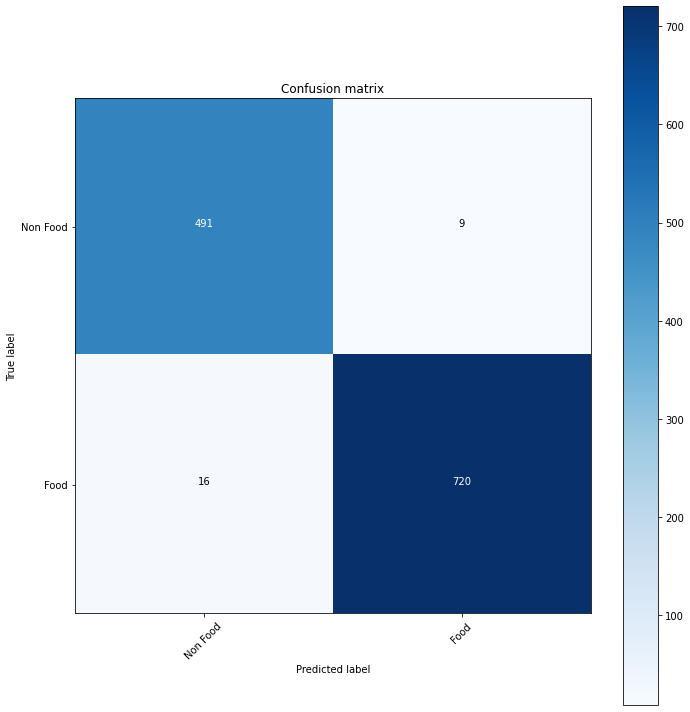

In [ ]:
plt.figure(figsize=(10,10))
class_names = ['Non Food', 'Food']
plot_confusion_matrix(cm, class_names)

Let's visualize the images it's getting wrong

In [ ]:
#Transform Image for vizualization
invTrans = transforms.Normalize(
   mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
   std=[1/0.229, 1/0.224, 1/0.225]
    )

#flatten images
image_list = [invTrans(item) for sublist in incorrect_examples for item in sublist]
len(image_list)




25

In [ ]:
#Filter the predictions that are wrong
predictions = [preds[i] for i in range(len(preds)) if preds[i] != targets[i]]
actuals = [targets[i] for i in range(len(preds)) if preds[i] != targets[i]]

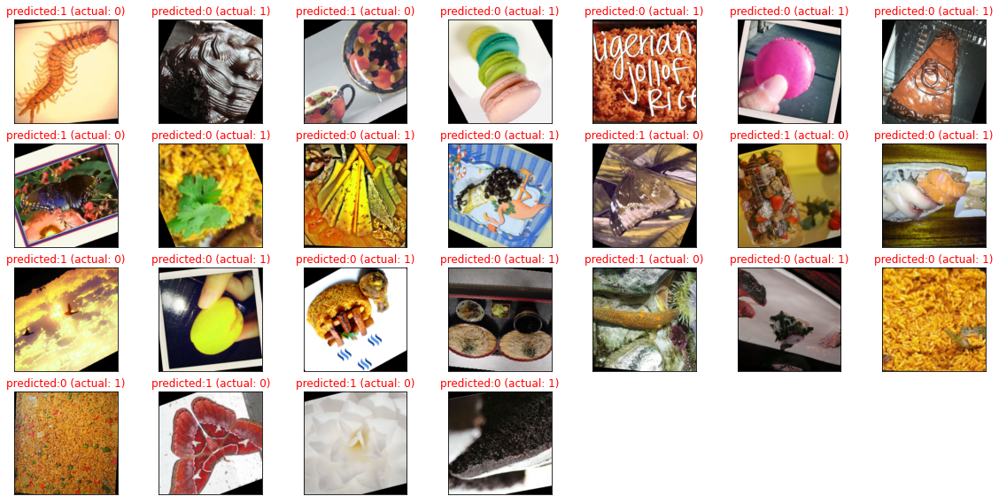

In [ ]:
#Visualize images
fig = plt.figure(figsize=(20, 15))
for idx in range(len(image_list)):
  ax = fig.add_subplot(6,7, idx +1,xticks=[], yticks=[] )
  imshow(np.clip(image_list[idx].cpu().numpy(),0,1))  #convert to numpy and clip to 0,1
  ax.set_title("predicted:{} (actual: {})".format(classes[predictions[idx]], classes[actuals[idx]]),
                 color=("green" if predictions[idx]==actuals[idx].item() else "red"))
  
 # plt.show()

We can see the images that the model is predicting wrong, so  we need oversample these to get a better prediction

In [ ]:
train_data.classes

['0', '1']

In [ ]:
#Class count for the train data and val data
a = torch.FloatTensor(train_data.targets)
print(f"The train data class count: {torch.unique(a, return_counts=True)}")
b = torch.FloatTensor(val_data.targets)
print(f" The val data class count: {torch.unique(b, return_counts=True)}")



The train data class count: (tensor([0., 1.]), tensor([1500, 1721]))
 The val data class count: (tensor([0., 1.]), tensor([500, 736]))


The food class is more represented in our data

In [ ]:
print(f"The size of the train data: {len(train_data)}")
print(f"The size of the validation data: {len(val_data)}")
print(f"The size of the test data: {len(eval_data)}")


The size of the train data: 3221
The size of the validation data: 1236
The size of the test data: 13706


##Run inference on the whole data with our trained model 


In [ ]:
#Read in our data that needs to be cleaned


%cd /content/images


/content/images


In [ ]:
ls

fried_rice/  jollof_rice/  ofada_rice/  village_rice/  white_rice_and_stew/


In [ ]:
cd /content/images/fried_rice/

/content/images/fried_rice


In [ ]:
mkdir 1 && mv * 1

mv: cannot move '1' to a subdirectory of itself, '1/1'


In [ ]:
cd /content/images/jollof_rice

/content/images/jollof_rice


In [ ]:
mkdir 1 && mv * 1

mv: cannot move '1' to a subdirectory of itself, '1/1'


In [ ]:
cd /content/images/ofada_rice

/content/images/ofada_rice


In [ ]:
mkdir 1 && mv * 1

mv: cannot move '1' to a subdirectory of itself, '1/1'


In [ ]:
cd /content/images/village_rice

/content/images/village_rice


In [ ]:
mkdir 1 && mv * 1

mv: cannot move '1' to a subdirectory of itself, '1/1'


In [ ]:
cd /content/images/white_rice_and_stew

/content/images/white_rice_and_stew


In [ ]:
mkdir 1 && mv * 1

mv: cannot move '1' to a subdirectory of itself, '1/1'


##Load the Data

In [ ]:
#Load the data
fried_rice = dset.ImageFolder('/content/images/fried_rice', transform = test_transformations)
jollof_rice = dset.ImageFolder('/content/images/jollof_rice', transform = test_transformations)
ofada_rice = dset.ImageFolder('/content/images/ofada_rice', transform = test_transformations)
village_rice = dset.ImageFolder('/content/images/village_rice', transform = test_transformations)
white_rice_and_stew = dset.ImageFolder('/content/images/white_rice_and_stew', transform = test_transformations)

#The loaders
fried_rice_loader = torch.utils.data.DataLoader(fried_rice, batch_size=32, shuffle=True, drop_last=False)
jollof_rice_loader = torch.utils.data.DataLoader(jollof_rice, batch_size=32, shuffle=True, drop_last=False)
ofada_rice_loader = torch.utils.data.DataLoader(ofada_rice, batch_size=32, shuffle=True, drop_last=False)
village_rice_loader = torch.utils.data.DataLoader(village_rice, batch_size=32, shuffle=True, drop_last=False)
white_rice_and_stew_loader = torch.utils.data.DataLoader(white_rice_and_stew, batch_size=32, shuffle=True, drop_last=False)

In [ ]:
print(f"The size of the fried rice data: {len(fried_rice)}")
print(f"The size of the jollof rice data: {len(jollof_rice)}")
print(f"The size of the ofada rice data: {len(ofada_rice)}")
print(f"The size of the village rice data: {len(village_rice)}")
print(f"The size of the white rice and stew  data: {len(white_rice_and_stew)}")


The size of the fried rice data: 253
The size of the jollof rice data: 370
The size of the ofada rice data: 179
The size of the village rice data: 602
The size of the white rice and stew  data: 487


In [ ]:
#Inferenece:
model.load_state_dict(torch.load('/content/Food-5K/evaluation/model_food_2.pt'))
fr_preds = []
fr_images = []
non_food_images = []

model.eval()
with torch.no_grad():
  for image, _ in fried_rice_loader:
    image = image.cuda()
    output = model(image)
    _, pred = torch.max(output,1)

    #get predictions and the images
    fr_preds.append(pred)
    fr_images.append((image))

    #get images labelled Non Food
    nf =  torch.zeros_like(pred)
    nonfood_tensor = pred.eq(nf.data.view_as(pred)) 
    non_food_images.append((image[nonfood_tensor]))


In [ ]:


#flatten images
fr_image_list = [invTrans(item) for sublist in fr_images for item in sublist]
len(fr_image_list)

253

In [ ]:
nf_images = [invTrans(item) for sublist in non_food_images for item in sublist]
len(nf_images)

4

In [ ]:
#fr_preds_x = torch.cat(fr_preds)

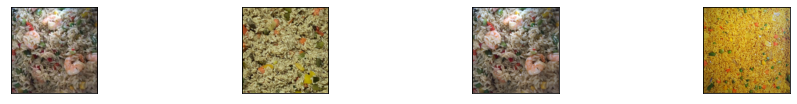

In [ ]:
#Visualize images
fig = plt.figure(figsize=(20, 15))

for idx in range(len(nf_images)):
  ax = fig.add_subplot(8,5, idx +1,xticks=[], yticks=[] )
  imshow(np.clip(nf_images[idx].cpu().numpy(),0,1))  #convert to numpy and clip to 0,1
  #ax.set_title(f'predicted:{class_names[fr_preds_x[idx]]}')

The images that are classified as non-food are food, we were expecting to see images with text over them as non-food, so we need to create synthetic data

In [ ]:
food_loader = {'fr': fried_rice_loader, 
               'jr': jollof_rice_loader,
               'or': ofada_rice_loader,
               'vr': village_rice_loader,
               'wr': white_rice_and_stew_loader}

def clean_food_and_display_non_food(x):
  

  food_preds = []
  food_images = []
  non_food_images = []

  model.load_state_dict(torch.load('/content/Food-5K/evaluation/model_food_2.pt'))
  model.eval()
  with torch.no_grad():
    for image, _ in food_loader[x]:
      image = image.cuda()
      output = model(image)
      _, pred = torch.max(output,1)

      #get predictions and the images
      food_preds.append(pred)
      food_images.append((image))

      #get images labelled Non Food
      nf =  torch.zeros_like(pred)
      nonfood_tensor = pred.eq(nf.data.view_as(pred)) 
      non_food_images.append((image[nonfood_tensor]))

      #flatten images
      nf_images = [invTrans(item) for sublist in non_food_images for item in sublist]
      nf_images_sample = random.sample(nf_images,len(nf_images))
    print(f'The are {len(nf_images)} non food images')
      
      

    #Visualize images
    fig = plt.figure(figsize=(25, 20))
    for idx in range(len(nf_images)):
      ax = fig.add_subplot(8,5, idx +1,xticks=[], yticks=[] )
      imshow(np.clip(nf_images_sample[idx].cpu().numpy(),0,1))
      ax.set_title(f'predicted: Non Food')


In [ ]:
def clean_food_and_display_food(x):
  

  food_preds = []
  food_images = []

  model.load_state_dict(torch.load('/content/Food-5K/evaluation/model_food_2.pt'))
  model.eval()
  with torch.no_grad():
    for image, _ in food_loader[x]:
      image = image.cuda()
      output = model(image)
      _, pred = torch.max(output,1)

      #get predictions 
      food_preds.append(pred)

      #get images labelled Food
      f =  torch.ones_like(pred)
      food_tensor = pred.eq(f.data.view_as(pred)) 
      food_images.append((image[food_tensor]))

      #flatten images
      f_images = [invTrans(item) for sublist in food_images for item in sublist]
      f_images_sample = random.sample(f_images,len(f_images))
    print(f'The are {len(f_images)} food images')
      

    #Visualize images
    fig = plt.figure(figsize=(20, 15))
    for idx in range(20):
      ax = fig.add_subplot(5,4, idx +1,xticks=[], yticks=[] )
      imshow(np.clip(f_images_sample[idx].cpu().numpy(),0,1))
      ax.set_title(f'predicted: Food')

The are 4 non food images
The are 249 food images


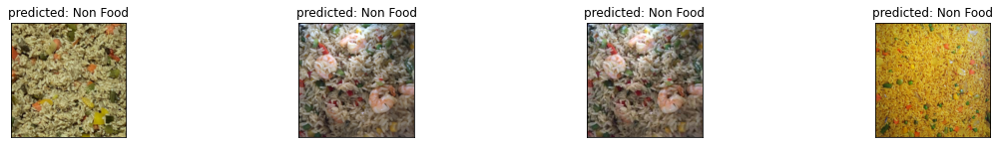

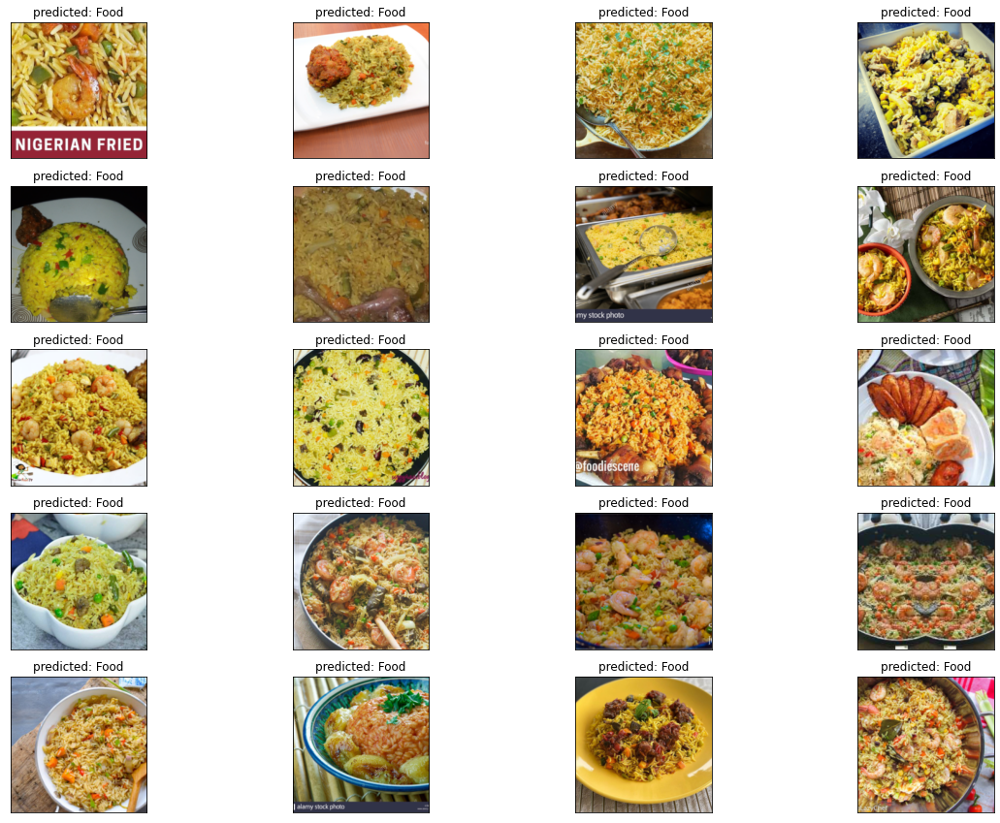

In [ ]:
#fried rice 
clean_food_and_display_non_food('fr')
clean_food_and_display_food('fr')

For the fried rice data:
> - The images that are classified as non-food:
    -  are actual food
 - For the food images
    - There are raw food stuff in the predicted food class 


- To Do:
  > - add more close-up images to the food class of the train data
  - add more raw food to the non-food image class of the train data.



 

The are 12 non food images
The are 358 food images


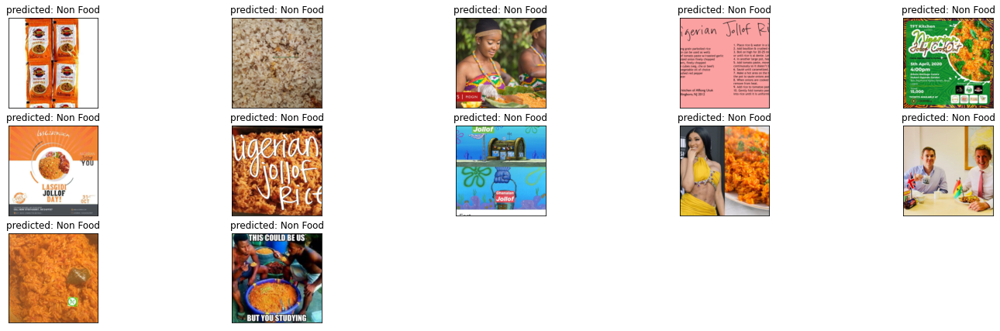

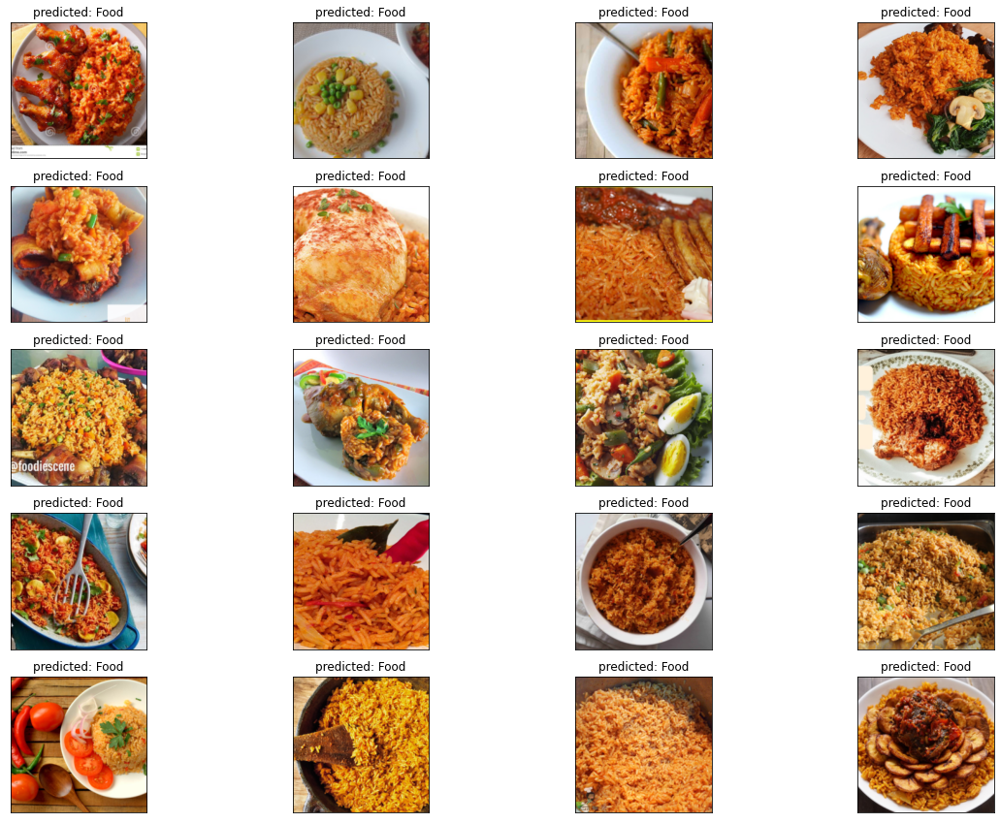

In [ ]:
#Jollof rice 
clean_food_and_display_non_food('jr')
clean_food_and_display_food('jr')


For the jollof rice data:
- The images that are classified as non-food consist of:
 > - images with people in them
 - text images and images with text over the food image
 - non-food images and close-up images of rice.
- The images that are classified as food consist of:
> - food images and some food images with text in them. Images with text in them were expected to be classifed as non food.

- TO DO:  
> -  we need to add more close-up rice images into our food class of the train data.
> - we need to add the food images with text into the non-food class of the train data.
 - we will add text on some images, create synthetic data and add them into the non-food class of the train data.
 

The are 6 non food images
The are 173 food images


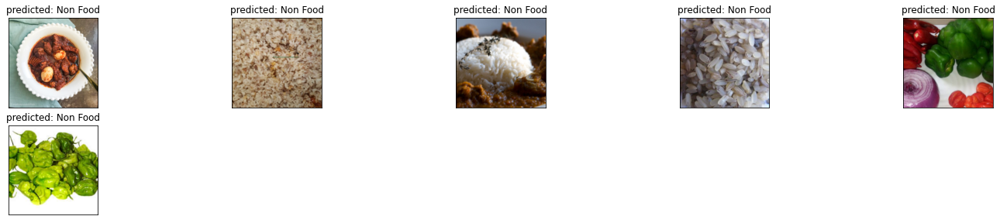

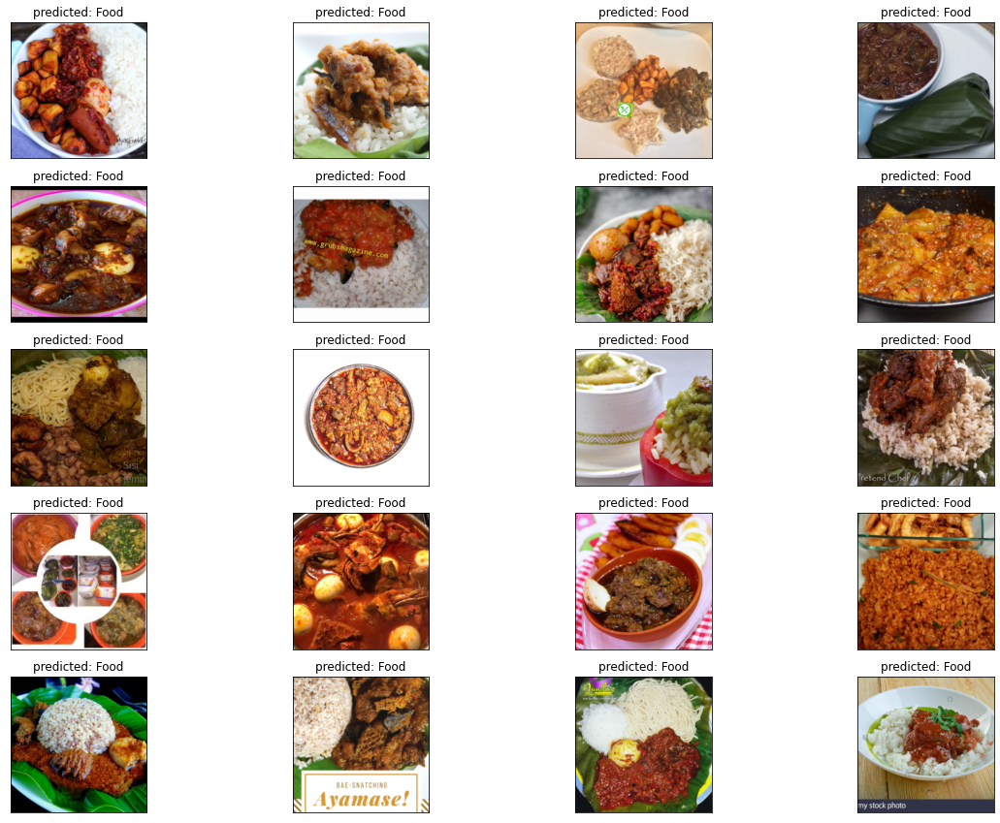

In [ ]:
#ofada rice
clean_food_and_display_non_food('or')
clean_food_and_display_food('or')

For the ofada rice data:
- The images that are classified as non-food consist of:
 > - close-up images of rice
 - raw food stuff 
 - food image with a plate.
- The images that are classified as food consist of:
> - food images and some food images with text in them. Images with text in them were expected to be classifed as non food.
  - images that are not rice but just stew, this will need to be cleaned later.

- TO DO:  
> -  we need to add more close-up rice images into our food class of the train data.
 - we need to add more raw foods into the non-food class of the train data.
 - We need add bounding boxes around plates and dishes of the food images
 - we will add text on some images, create synthetic data and add them into the non-food class of the train data.
 

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


The are 434 food images
The are 168 non food images


ValueError: ignored

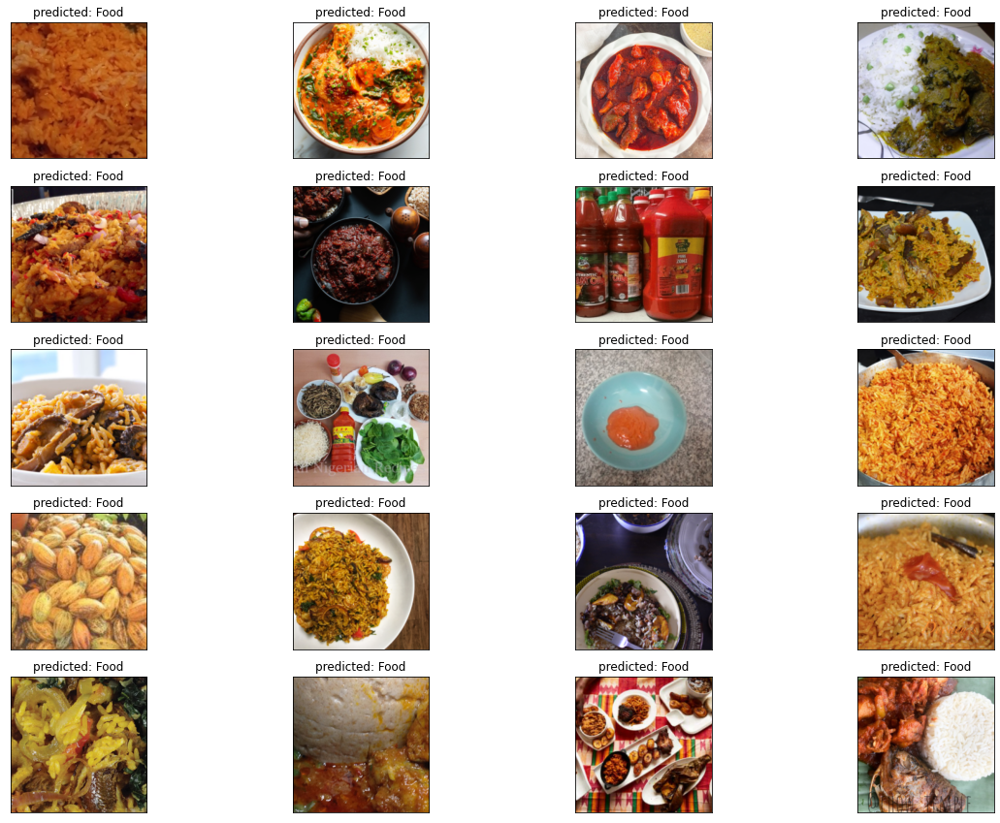

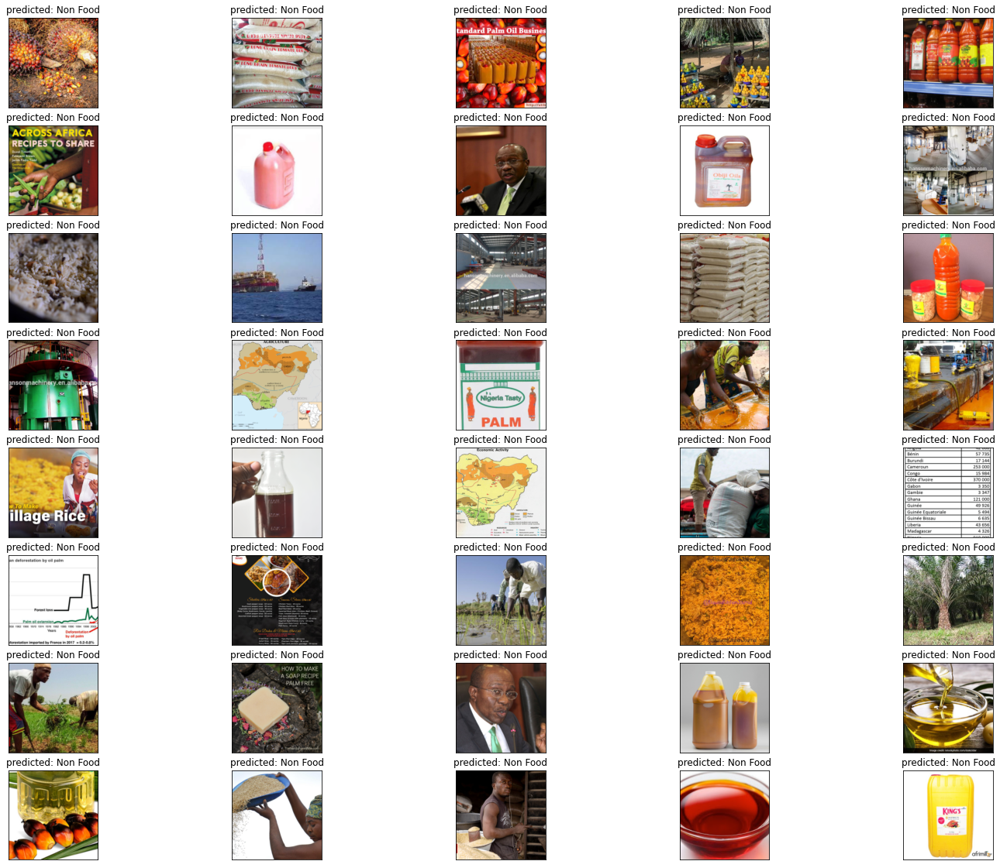

In [ ]:
#Village rice
clean_food_and_display_food('vr')
clean_food_and_display_non_food('vr')


For the village rice data:
- The images that are classified as non-food consist of:
 > - people in images
 - raw food stuff and other objects 
 - food image with a plate.
 - close-up images of rice
- The images that are classified as food consist of:
 > - food images and some food images with text in them.
 - Images with text in them were expected to be classifed as non food.
  - images that are not rice but just stew, this will need to be cleaned later.
  - raw food
  - people

- TO DO:  
> -  we need to add more close-up rice images into our food class of the train data.
> - we need to add more raw foods into the non-food class of the train data.
> - other than the close-up food image, all other non-food image here will be fed back into the train_data
  - create synthetic data with text on food images

The are 3 non food images
The are 484 food images


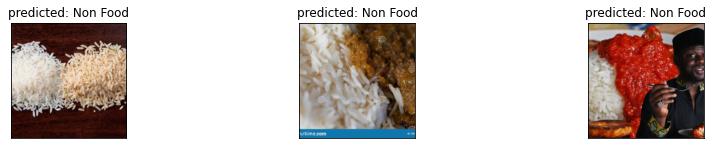

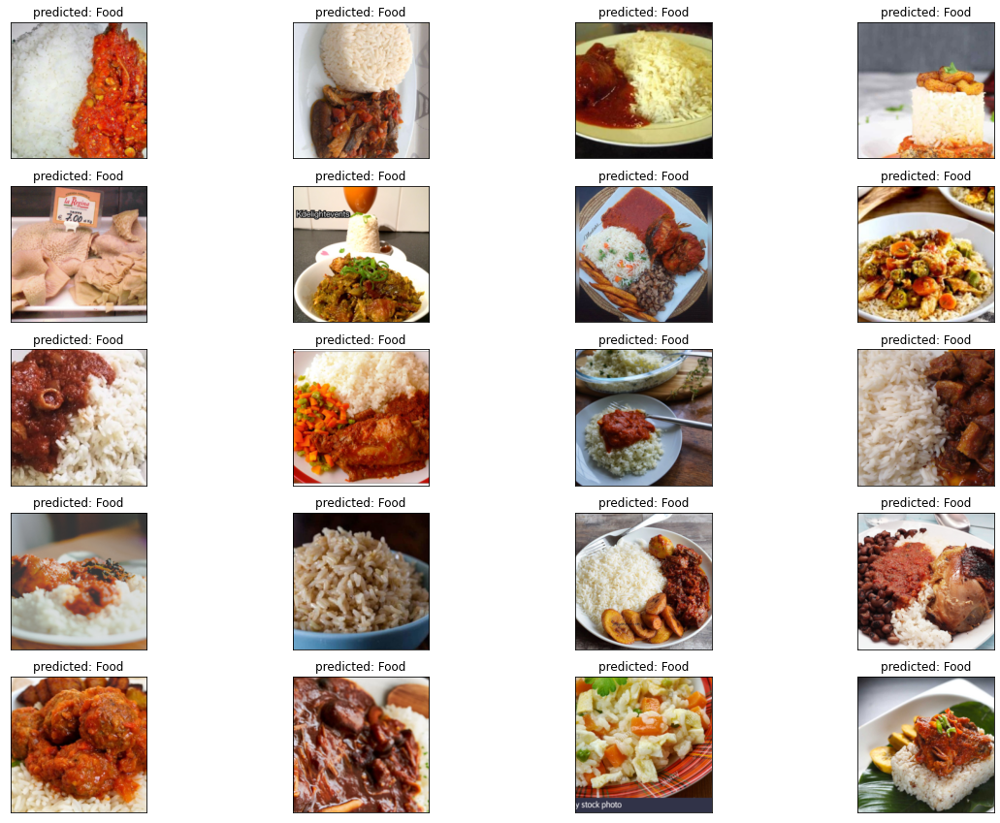

In [ ]:
#White rice
clean_food_and_display_non_food('wr')
clean_food_and_display_food('wr')

For the white rice data:
- The images that are classified as non-food consist of:
 > - people in images
 - raw food stuff 
 - close-up images of rice
- The images that are classified as food consist of:
 > - food images of rice
 - food images with text
 - images that are not rice but just stew, this will need to be cleaned later.

- TO DO:  
> -  we need to add more close-up rice images into our food class of the train data.
> - we need to add more raw foods into the non-food class of the train data.

## Create Data for retraining

Train data should be just of the rice classified data
- The predictions have to be filtered to remove misclassified.
suggestion is adding index to the images and slicing.

> - close up images of rice in the food data
- more raw foods in the non-food data
- people with food in the non-food data
- add text to images
- All non-food images of vilage rice should be in the non-food data
  - *get preds and image tensors and concatenate them*
- add bounding boxes around plates

There are three steps to this process:

- Apply the model to a validation data set and capture which validation items were classified correctly and incorrectly. This is your new training data: your validation items now have an additional label of “Correct” or “Incorrect”

- Create a new output layer for the model and train that new layer on your new training data, predicting your new “Correct”/”Incorrect” labels.

- Run your unlabeled data items through the new model and sample the items that are predicted to be “Incorrect” with the highest confidence.


PyTorch makes this incredibly simple with the ability to pass the activation of every neuron back to other processes, allowing us to build our Active Transfer Learning model on top of our original model. Let’s assume we have a simple network with one hidden layer, with this forward() function:

In [ ]:
probs = [F.softmax(el, dim = 0)[i].item() for i,el in zip(preds,output)]
probs

[0.00013061700155958533,
 0.9999865293502808,
 0.00010968394781230018,
 0.9999102354049683,
 0.9151667356491089,
 0.9999990463256836,
 0.002975448267534375,
 1.0,
 0.026516156271100044,
 0.010899639688432217,
 0.9999582767486572,
 0.9988670349121094,
 0.7147541046142578,
 0.000493369298055768,
 0.9991089701652527,
 0.9998416900634766,
 0.052709389477968216,
 0.0009047122439369559,
 0.0002032218617387116,
 1.4841800748399692e-06,
 4.2316301005485e-06,
 0.007739079184830189,
 0.9999635219573975,
 1.3940972394266282e-06,
 2.3020313165034167e-05,
 0.9998852014541626,
 0.9999974966049194,
 0.004781567025929689,
 0.002597733400762081]

In [ ]:
outputs = []
preds = []
model.eval()
with torch.no_grad():
  for image, _ in food_loader['fr']:
    image = image.cuda()
    output = model(image)
    _, pred = torch.max(output,1)
    preds.append(pred)
    outputs.append(output)
    

In [ ]:
outputs = torch.cat(outputs)

In [ ]:
preds = torch.cat(preds)

In [ ]:
F.softmax(output[0], dim = 0) #probailty score for each class 

tensor([1.5524e-05, 9.9998e-01], device='cuda:0')

In [ ]:
for idx, (el,i) in enumerate(zip(preds,outputs)):
  if el.item() == 1:
    x = F.softmax(i, dim = 0)
    most_conf = torch.max(x)
    #print(f"most conf: {most_conf}")
    num_labels = x.numel()
    numerator = (num_labels * 1 - most_conf)
    denominator = (num_labels - 1)
    least_conf = numerator/denominator
    print(idx,least_conf)

0 tensor(1.0004, device='cuda:0')
1 tensor(1.0000, device='cuda:0')
2 tensor(1.0007, device='cuda:0')
3 tensor(1.0000, device='cuda:0')
4 tensor(1.0000, device='cuda:0')
5 tensor(1.2619, device='cuda:0')
6 tensor(1.0006, device='cuda:0')
7 tensor(1.0000, device='cuda:0')
8 tensor(1.0000, device='cuda:0')
9 tensor(1.0000, device='cuda:0')
10 tensor(1.0001, device='cuda:0')
11 tensor(1.0000, device='cuda:0')
12 tensor(1.0001, device='cuda:0')
13 tensor(1.0003, device='cuda:0')
14 tensor(1.0007, device='cuda:0')
15 tensor(1.0008, device='cuda:0')
16 tensor(1.0012, device='cuda:0')
17 tensor(1.0044, device='cuda:0')
18 tensor(1.0002, device='cuda:0')
19 tensor(1., device='cuda:0')
20 tensor(1., device='cuda:0')
21 tensor(1.0004, device='cuda:0')
22 tensor(1.0000, device='cuda:0')
23 tensor(1.0003, device='cuda:0')
24 tensor(1.0000, device='cuda:0')
25 tensor(1.0109, device='cuda:0')
26 tensor(1.0019, device='cuda:0')
27 tensor(1.0000, device='cuda:0')
28 tensor(1.0019, device='cuda:0')
29 

In [ ]:
#Least Confident
confidences = []
indices = []

for idx,( el,i) in enumerate( zip(preds,outputs)):
  x = F.softmax(i, dim = 0)
  most_conf = torch.max(x)
  #print(f"most conf: {most_conf}")
  num_labels = x.numel()
  numerator = (num_labels * 1 - most_conf)
  denominator = (num_labels - 1)
  least_conf = numerator/denominator
  print(f"index: {idx},pred:{el},  most confident: {most_conf.item()},least confident: {least_conf.item()}")
  confidences.append(most_conf.tolist())
  indices.append(idx)

conf = np.asarray(confidences)
ind = np.asarray(indices)
sorted_pool = np.argsort(conf)
print(ind[sorted_pool][0:2]) #indices with the lowest most_conf

index: 0,pred:1,  most confident: 0.999606192111969,least confident: 1.0003938674926758
index: 1,pred:1,  most confident: 0.9999582767486572,least confident: 1.0000417232513428
index: 2,pred:1,  most confident: 0.9992647767066956,least confident: 1.0007352828979492
index: 3,pred:1,  most confident: 0.9999697208404541,least confident: 1.000030279159546
index: 4,pred:1,  most confident: 0.9999997615814209,least confident: 1.000000238418579
index: 5,pred:1,  most confident: 0.7380719184875488,least confident: 1.2619280815124512
index: 6,pred:1,  most confident: 0.999405026435852,least confident: 1.000594973564148
index: 7,pred:1,  most confident: 0.9999996423721313,least confident: 1.0000003576278687
index: 8,pred:1,  most confident: 0.9999828338623047,least confident: 1.0000171661376953
index: 9,pred:1,  most confident: 0.9999997615814209,least confident: 1.000000238418579
index: 10,pred:1,  most confident: 0.9998660087585449,least confident: 1.000133991241455
index: 11,pred:1,  most con

In [ ]:
sorted_pool = np.argsort(conf)
least_conf = sorted_pool[0:10]

In [ ]:
#Visualize images
fig = plt.figure(figsize=(20, 15))
for index,i in enumerate(least_conf):
  ax = fig.add_subplot(2,4, index + 1,xticks=[], yticks=[] )
  imshow(np.clip(f_images[i].cpu().numpy(),0,1))
  ax.set_title(f'predicted:{preds[i]}, confidence score: {np.round(conf[i],7)}')

In [ ]:
#calculate uncertainity (least_sample)
outputs = torch.cat(outputs)
food_preds = torch.cat(food_preds)

In [ ]:

for idx,( el,i) in enumerate( zip(preds,outputs)):
  x = F.softmax(outputs[idx], dim = 0)
  most_conf = torch.max(x)
  confidences.append(most_conf.tolist())
  indices.append(idx)
  conf = np.asarray(confidences)
  #print(conf)
  sorted_pool = np.argsort(conf)
  least_conf = sorted_pool[0:10]


#Visualize images
fig = plt.figure(figsize=(20, 15))
for index,i in enumerate(least_conf):
  ax = fig.add_subplot(2,4, index + 1,xticks=[], yticks=[] )
  imshow(np.clip(f_images[i].cpu().numpy(),0,1))
  ax.set_title(f'predicted:{pred[i]}, confidence score: {np.round(conf[i],7)}')
    

**a.view(x,y)**: reshapes a tensor, where x is the row and y is the column. When x is "-1" it means that you dont know how many rows will be returned but you know the number of columns. It is similar to the numpy reshape function.

**a.view_as(x)**: reshapes a tensor to the shape of tensor x.

**a.randn(x,y)**:creates a tensor of shape row x and column y filled with random numbers from a normal distribution with mean 0 and variance 1. 

**a.size**: returns the shape of the tensor.

**a.max()**: returns the max value in the tensor.

**a.min()**: returns the min value in the tensor.

**a.equal(m,n)**: returns a boolean value after comparing m and n shapes.

**a.eq(m,n)**: returns a boolean value after comparing all elemenst in m and n.

**pred.eq(target.data.view_as(pred))** : get the data of target and reshaped it to pred and return the boolean values if the results match pred.

**len(val_loader)** : is the number of data in the datasets divided by the batches. 

 So, steps
> 1- pick the images which are mis classified

> 2- collect similar images from an image search by using “image similarity” feature in yandex.com
> 3- from those similar images, compute your own similarity vector

> 4- explore those images by similarity (plot a t sne or pca) to see the outliers

> 5- remove / curate

> 6- add those curated images to your dataset as new inputs

> 7- use those to fine tune with augmentation for your network to learn